In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

🔍 Looking for clean images...

🔎 Checking paths:
  ✅ /kaggle/input/datasets/wmpibweerasinghe/iqa-wn/Original_New
      → Found 29 image files - Using this!
  ❌ /kaggle/input/iqa-wn/Original_New
  ❌ /kaggle/input/iqa-gblur/sharp
  ❌ /kaggle/input/datasets/wmpibweerasinghe/iqa-gblur/sharp

✅ Using clean images from: /kaggle/input/datasets/wmpibweerasinghe/iqa-wn/Original_New

✅ Directories created!
Checking directory: /kaggle/input/datasets/wmpibweerasinghe/iqa-wn/Original_New
Directory exists: True
Total files in directory: 29
Sample files: ['img160.bmp', 'img148.bmp', 'img170.bmp', 'img172.bmp', 'img157.bmp']
Found 29 images with extension *.bmp

✅ Total sharp images found: 29

🎨 Generating 145 training samples...
   5 variations per sharp image



Processing images: 100%|██████████| 29/29 [00:12<00:00,  2.36it/s]



✅ Generated 145 training samples!

Dataset structure:
  📁 /kaggle/working/block_mask_dataset/images/ - 145 partially-blocked images
  📁 /kaggle/working/block_mask_dataset/masks/ - 145 ground truth masks
  📁 /kaggle/working/block_mask_dataset/visualizations/ - 10 sample visualizations

📊 Dataset Statistics:
  Total samples: 145
  Samples per image: 5
  Blocked regions per sample: 1-5 (random)
  JPEG quality: 5-30 (random, lower = more blocking)
  Region size: 20-60% of image dimension

🎨 Sample visualizations saved!
Check: /kaggle/working/block_mask_dataset/visualizations/


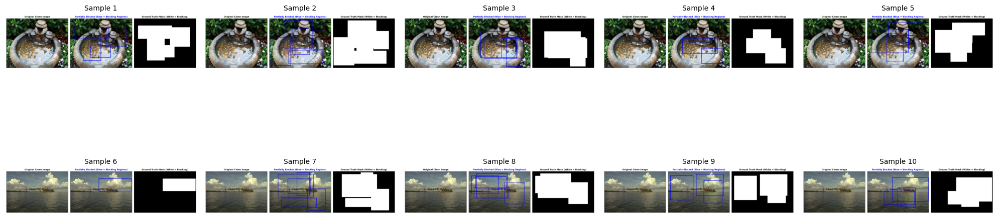


✅ Training data generation complete!
📁 Output directory: /kaggle/working/block_mask_dataset

💡 Note: Using BLUE color for blocking visualization (different from red=blur, green=noise)


In [2]:
"""
Step 1: Generate Synthetic Training Data for Blocking Artifact Detection
Creates partially-blocked images with ground truth masks using JPEG compression
"""

import torch
import cv2
import numpy as np
import os
import glob
import random
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm

# ============================================================================
# Configuration
# ============================================================================

# Use clean images from existing datasets (same 29 images)
print("🔍 Looking for clean images...")

# The actual Kaggle path structure based on diagnostic output
SHARP_DIR = None
possible_dirs = [
    '/kaggle/input/datasets/wmpibweerasinghe/iqa-wn/Original_New',  # Actual Kaggle path
    '/kaggle/input/iqa-wn/Original_New',                             # Alternative
    '/kaggle/input/iqa-gblur/sharp',                                 # Alternative
    '/kaggle/input/datasets/wmpibweerasinghe/iqa-gblur/sharp',      # Alternative
]

print("\n🔎 Checking paths:")
for possible_dir in possible_dirs:
    exists = os.path.exists(possible_dir)
    print(f"  {'✅' if exists else '❌'} {possible_dir}")
    if exists and SHARP_DIR is None:
        # Count image files
        try:
            files = os.listdir(possible_dir)
            image_files = [f for f in files if f.lower().endswith(('.bmp', '.png', '.jpg', '.jpeg'))]
            if len(image_files) > 0:
                SHARP_DIR = possible_dir
                print(f"      → Found {len(image_files)} image files - Using this!")
        except Exception as e:
            print(f"      → Error: {e}")

if SHARP_DIR is None:
    print("\n❌ ERROR: Could not find clean images!")
    print("\n💡 Please run Check_Dataset_Paths.py to see available datasets")
    raise FileNotFoundError("Could not find clean images directory!")

print(f"\n✅ Using clean images from: {SHARP_DIR}\n")

OUTPUT_DIR = '/kaggle/working/block_mask_dataset'

# Create output directories
os.makedirs(f'{OUTPUT_DIR}/images', exist_ok=True)
os.makedirs(f'{OUTPUT_DIR}/masks', exist_ok=True)
os.makedirs(f'{OUTPUT_DIR}/visualizations', exist_ok=True)

print("✅ Directories created!")

# ============================================================================
# Helper Functions
# ============================================================================

def generate_random_rectangles(img_shape, num_regions=None):
    """Generate random rectangular regions for blocking"""
    h, w = img_shape[:2]
    
    if num_regions is None:
        num_regions = random.randint(1, 5)  # 1-5 blocked regions per image
    
    regions = []
    for _ in range(num_regions):
        # Random rectangle size (20-60% of image dimension)
        rect_h = random.randint(int(h * 0.2), int(h * 0.6))
        rect_w = random.randint(int(w * 0.2), int(w * 0.6))
        
        # Random position
        x = random.randint(0, max(0, w - rect_w))
        y = random.randint(0, max(0, h - rect_h))
        
        regions.append((x, y, rect_w, rect_h))
    
    return regions

def apply_jpeg_blocking_to_region(image, region, quality):
    """Apply JPEG compression blocking to a specific rectangular region"""
    x, y, w, h = region
    
    # Extract region
    roi = image[y:y+h, x:x+w].copy()
    
    # Apply JPEG compression with low quality
    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
    _, encoded = cv2.imencode('.jpg', roi, encode_param)
    blocked_roi = cv2.imdecode(encoded, cv2.IMREAD_COLOR)
    
    # Create output image
    output = image.copy()
    output[y:y+h, x:x+w] = blocked_roi
    
    return output

def create_mask_from_regions(regions, img_shape):
    """Create binary mask from rectangular regions"""
    h, w = img_shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)
    
    for region in regions:
        x, y, rect_w, rect_h = region
        mask[y:y+rect_h, x:x+rect_w] = 255
    
    return mask

def visualize_sample(sharp_img, blocked_img, mask, regions, save_path):
    """Visualize training sample with BLUE color for blocking"""
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Original sharp
    axes[0].imshow(cv2.cvtColor(sharp_img, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Clean Image', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    
    # Partially blocked with BLUE bounding boxes
    blocked_rgb = cv2.cvtColor(blocked_img, cv2.COLOR_BGR2RGB)
    axes[1].imshow(blocked_rgb)
    for region in regions:
        x, y, w, h = region
        rect = plt.Rectangle((x, y), w, h, fill=False, edgecolor='blue', linewidth=2)
        axes[1].add_patch(rect)
    axes[1].set_title('Partially Blocked (Blue = Blocking Regions)', fontsize=12, fontweight='bold', color='blue')
    axes[1].axis('off')
    
    # Ground truth mask
    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Ground Truth Mask (White = Blocking)', fontsize=12, fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()

# ============================================================================
# Generate Training Data
# ============================================================================

# Get all sharp images - try multiple extensions
print(f"Checking directory: {SHARP_DIR}")
print(f"Directory exists: {os.path.exists(SHARP_DIR)}")

# List all files in directory
if os.path.exists(SHARP_DIR):
    all_files = os.listdir(SHARP_DIR)
    print(f"Total files in directory: {len(all_files)}")
    if len(all_files) > 0:
        print(f"Sample files: {all_files[:5]}")

# Try multiple extensions
sharp_images = []
for ext in ['*.bmp', '*.png', '*.jpg', '*.jpeg', '*.BMP', '*.PNG', '*.JPG']:
    found = glob.glob(f'{SHARP_DIR}/{ext}')
    if found:
        sharp_images.extend(found)
        print(f"Found {len(found)} images with extension {ext}")

sharp_images = sorted(list(set(sharp_images)))  # Remove duplicates
print(f"\n✅ Total sharp images found: {len(sharp_images)}")

# Generate multiple samples per image
SAMPLES_PER_IMAGE = 5  # Create 5 variations per sharp image
TOTAL_SAMPLES = len(sharp_images) * SAMPLES_PER_IMAGE

print(f"\n🎨 Generating {TOTAL_SAMPLES} training samples...")
print(f"   {SAMPLES_PER_IMAGE} variations per sharp image\n")

sample_idx = 0
visualization_count = 0

for img_path in tqdm(sharp_images, desc="Processing images"):
    # Load sharp image
    sharp_img = cv2.imread(img_path)
    
    if sharp_img is None:
        continue
    
    img_name = Path(img_path).stem
    
    # Generate multiple variations
    for var_idx in range(SAMPLES_PER_IMAGE):
        # Generate random blocked regions
        num_regions = random.randint(1, 5)
        regions = generate_random_rectangles(sharp_img.shape, num_regions)
        
        # Add blocking to each region
        blocked_img = sharp_img.copy()
        for region in regions:
            quality = random.randint(5, 30)  # Random JPEG quality (lower = more blocking)
            blocked_img = apply_jpeg_blocking_to_region(blocked_img, region, quality)
        
        # Create ground truth mask
        mask = create_mask_from_regions(regions, sharp_img.shape)
        
        # Save images and masks
        sample_name = f'{img_name}_var{var_idx:02d}'
        cv2.imwrite(f'{OUTPUT_DIR}/images/{sample_name}.png', blocked_img)
        cv2.imwrite(f'{OUTPUT_DIR}/masks/{sample_name}.png', mask)
        
        # Visualize first 10 samples
        if visualization_count < 10:
            visualize_sample(
                sharp_img, blocked_img, mask, regions,
                f'{OUTPUT_DIR}/visualizations/sample_{sample_idx:03d}.png'
            )
            visualization_count += 1
        
        sample_idx += 1

print(f"\n✅ Generated {sample_idx} training samples!")
print(f"\nDataset structure:")
print(f"  📁 {OUTPUT_DIR}/images/ - {sample_idx} partially-blocked images")
print(f"  📁 {OUTPUT_DIR}/masks/ - {sample_idx} ground truth masks")
print(f"  📁 {OUTPUT_DIR}/visualizations/ - 10 sample visualizations")

# ============================================================================
# Dataset Statistics
# ============================================================================

print(f"\n📊 Dataset Statistics:")
print(f"  Total samples: {sample_idx}")
print(f"  Samples per image: {SAMPLES_PER_IMAGE}")
print(f"  Blocked regions per sample: 1-5 (random)")
print(f"  JPEG quality: 5-30 (random, lower = more blocking)")
print(f"  Region size: 20-60% of image dimension")

# Show sample visualization
print(f"\n🎨 Sample visualizations saved!")
print(f"Check: {OUTPUT_DIR}/visualizations/")

# Create a summary figure
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for idx in range(min(10, visualization_count)):
    row = idx // 5
    col = idx % 5
    img = plt.imread(f'{OUTPUT_DIR}/visualizations/sample_{idx:03d}.png')
    axes[row, col].imshow(img)
    axes[row, col].axis('off')
    axes[row, col].set_title(f'Sample {idx+1}', fontsize=10)

plt.tight_layout()
plt.savefig(f'{OUTPUT_DIR}/dataset_overview.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✅ Training data generation complete!")
print(f"📁 Output directory: {OUTPUT_DIR}")
print(f"\n💡 Note: Using BLUE color for blocking visualization (different from red=blur, green=noise)")


Device: cuda
Dataset size: 145
Train: 116, Val: 29
U-Net parameters: 31,043,521

🚀 Starting U-Net training for blocking detection...

Epoch 10/100 | Train: 0.4624 | Val: 0.4887 | Time: 1.3min
Epoch 20/100 | Train: 0.3415 | Val: 0.5294 | Time: 2.7min
Epoch 30/100 | Train: 0.2713 | Val: 0.3626 | Time: 4.1min
Epoch 40/100 | Train: 0.1968 | Val: 0.3598 | Time: 5.5min
Epoch 50/100 | Train: 0.1555 | Val: 0.2947 | Time: 6.9min
Epoch 60/100 | Train: 0.1012 | Val: 0.2778 | Time: 8.3min
Epoch 70/100 | Train: 0.0831 | Val: 0.2539 | Time: 9.7min
Epoch 80/100 | Train: 0.0654 | Val: 0.2455 | Time: 11.1min
Epoch 90/100 | Train: 0.0634 | Val: 0.2453 | Time: 12.5min
Epoch 100/100 | Train: 0.0605 | Val: 0.2518 | Time: 13.8min

✅ Training complete! Time: 13.8 minutes
Best validation loss: 0.2310


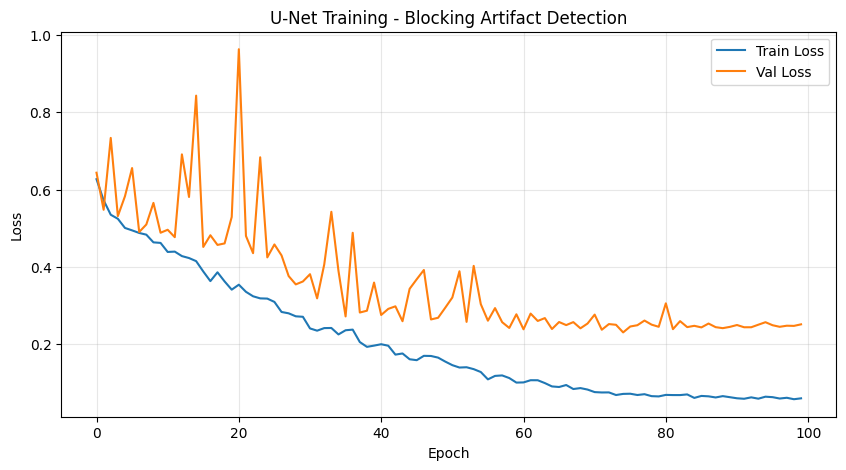


✅ Model saved to: /kaggle/working/block_unet_checkpoints/unet_best.pth


In [3]:
"""
Step 2: U-Net Blocking Artifact Detection Network
Train U-Net to detect blocked regions in images
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR

import cv2
import numpy as np
import glob
import os
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm
import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# ============================================================================
# U-Net Architecture (Same as blur/noise detection)
# ============================================================================

class DoubleConv(nn.Module):
    """Double convolution block"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    """U-Net for blocking mask detection"""
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        # Encoder
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        
        # Bottleneck
        self.bottleneck = DoubleConv(512, 1024)
        
        # Decoder
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        
        # Output
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
    
    def forward(self, x):
        # Encoder
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        enc3 = self.enc3(self.pool2(enc2))
        enc4 = self.enc4(self.pool3(enc3))
        
        # Bottleneck
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        # Decoder with skip connections
        dec4 = self.up4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.dec4(dec4)
        
        dec3 = self.up3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.up2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.up1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)
        
        # Output
        out = self.out(dec1)
        return torch.sigmoid(out)

# ============================================================================
# Loss Functions
# ============================================================================

class DiceLoss(nn.Module):
    """Dice Loss for segmentation"""
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, pred, target):
        pred = pred.view(-1)
        target = target.view(-1)
        
        intersection = (pred * target).sum()
        dice = (2. * intersection + self.smooth) / (pred.sum() + target.sum() + self.smooth)
        
        return 1 - dice

class CombinedLoss(nn.Module):
    """BCE + Dice Loss"""
    def __init__(self):
        super().__init__()
        self.bce = nn.BCELoss()
        self.dice = DiceLoss()
    
    def forward(self, pred, target):
        return 0.5 * self.bce(pred, target) + 0.5 * self.dice(pred, target)

# ============================================================================
# Dataset
# ============================================================================

class BlockMaskDataset(Dataset):
    def __init__(self, image_dir, mask_dir, size=256):
        self.image_paths = sorted(glob.glob(f'{image_dir}/*.png'))
        self.mask_paths = sorted(glob.glob(f'{mask_dir}/*.png'))
        self.size = size
        
        assert len(self.image_paths) == len(self.mask_paths), "Mismatch in images and masks"
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        # Load image and mask
        image = cv2.imread(self.image_paths[idx])
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)
        
        # Resize
        image = cv2.resize(image, (self.size, self.size))
        mask = cv2.resize(mask, (self.size, self.size))
        
        # Convert to RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Normalize
        image = image.astype(np.float32) / 255.0
        mask = mask.astype(np.float32) / 255.0
        
        # To tensor
        image = torch.from_numpy(image).permute(2, 0, 1)
        mask = torch.from_numpy(mask).unsqueeze(0)
        
        return image, mask

# ============================================================================
# Training Setup
# ============================================================================

DATA_DIR = '/kaggle/working/block_mask_dataset'
IMAGE_DIR = f'{DATA_DIR}/images'
MASK_DIR = f'{DATA_DIR}/masks'

# Create dataset
dataset = BlockMaskDataset(IMAGE_DIR, MASK_DIR, size=256)
print(f"Dataset size: {len(dataset)}")

# Split train/val
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)

print(f"Train: {len(train_dataset)}, Val: {len(val_dataset)}")

# Model
model = UNet(in_channels=3, out_channels=1).to(device)
total_params = sum(p.numel() for p in model.parameters())
print(f"U-Net parameters: {total_params:,}")

# Training config
NUM_EPOCHS = 100
LEARNING_RATE = 1e-4

criterion = CombinedLoss()
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)
scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)

# ============================================================================
# Training Loop
# ============================================================================

checkpoint_dir = '/kaggle/working/block_unet_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

train_losses = []
val_losses = []
best_val_loss = float('inf')

print("\n🚀 Starting U-Net training for blocking detection...\n")
start_time = time.time()

for epoch in range(NUM_EPOCHS):
    # Train
    model.train()
    train_loss = 0.0
    
    for images, masks in train_loader:
        images = images.to(device)
        masks = masks.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, masks)
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    train_loss /= len(train_loader)
    train_losses.append(train_loss)
    
    # Validation
    model.eval()
    val_loss = 0.0
    
    with torch.no_grad():
        for images, masks in val_loader:
            images = images.to(device)
            masks = masks.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, masks)
            val_loss += loss.item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    
    scheduler.step()
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        elapsed = (time.time() - start_time) / 60
        print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Train: {train_loss:.4f} | Val: {val_loss:.4f} | Time: {elapsed:.1f}min")
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
        }, f'{checkpoint_dir}/unet_best.pth')

total_time = (time.time() - start_time) / 60
print(f"\n✅ Training complete! Time: {total_time:.1f} minutes")
print(f"Best validation loss: {best_val_loss:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('U-Net Training - Blocking Artifact Detection')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig(f'{checkpoint_dir}/training_history.png', dpi=150)
plt.show()

print(f"\n✅ Model saved to: {checkpoint_dir}/unet_best.pth")


✅ U-Net model loaded!
   Best validation loss: 0.2310

🎨 Detecting blocking masks for 10 sample images...

✅ img146_var00.png - Detected 1 blocking regions
✅ img146_var01.png - Detected 1 blocking regions
✅ img146_var02.png - Detected 1 blocking regions
✅ img146_var03.png - Detected 1 blocking regions
✅ img146_var04.png - Detected 1 blocking regions
✅ img147_var00.png - Detected 1 blocking regions
✅ img147_var01.png - Detected 1 blocking regions
✅ img147_var02.png - Detected 1 blocking regions
✅ img147_var03.png - Detected 2 blocking regions
✅ img147_var04.png - Detected 1 blocking regions

✅ Results saved to: /kaggle/working/block_detection_results/


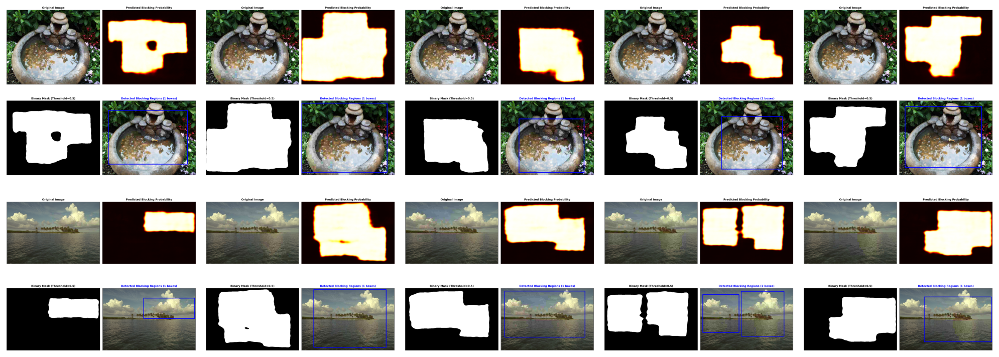


🎉 Blocking detection visualization complete!

💡 Note: Using BLUE bounding boxes (different from red=blur, green=noise)


In [4]:
"""
Step 3: Visualize U-Net Blocking Detection Results
Load trained U-Net and visualize detected blocking masks with BLUE bounding boxes
"""

import torch
import torch.nn as nn
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
from pathlib import Path

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ============================================================================
# U-Net Architecture (Same as Training)
# ============================================================================

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        
        self.bottleneck = DoubleConv(512, 1024)
        
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
    
    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        enc3 = self.enc3(self.pool2(enc2))
        enc4 = self.enc4(self.pool3(enc3))
        
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        dec4 = self.up4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.dec4(dec4)
        
        dec3 = self.up3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.up2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.up1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)
        
        out = self.out(dec1)
        return torch.sigmoid(out)

# ============================================================================
# Load Model
# ============================================================================

model = UNet(in_channels=3, out_channels=1).to(device)
checkpoint = torch.load('/kaggle/working/block_unet_checkpoints/unet_best.pth')
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

print(f"✅ U-Net model loaded!")
print(f"   Best validation loss: {checkpoint['val_loss']:.4f}")

# ============================================================================
# Helper Functions
# ============================================================================

def detect_block_mask(image_path, model, device, threshold=0.5):
    """Detect blocking mask for an image"""
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    # Resize for model
    img_resized = cv2.resize(img_rgb, (256, 256))
    img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float() / 255.0
    img_tensor = img_tensor.unsqueeze(0).to(device)
    
    # Predict mask
    with torch.no_grad():
        mask_pred = model(img_tensor)
    
    # Convert to numpy
    mask = mask_pred.squeeze().cpu().numpy()
    mask = cv2.resize(mask, (w, h))
    
    # Threshold
    mask_binary = (mask > threshold).astype(np.uint8) * 255
    
    return img_rgb, mask, mask_binary

def extract_bounding_boxes(mask_binary, min_area=500):
    """Extract bounding boxes from binary mask"""
    contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    boxes = []
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > min_area:
            x, y, w, h = cv2.boundingRect(contour)
            boxes.append((x, y, w, h))
    
    return boxes

def visualize_detection(image, mask, mask_binary, boxes, save_path):
    """Visualize blocking detection results with BLUE color"""
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    
    # Original image
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    # Predicted mask (probability)
    axes[0, 1].imshow(mask, cmap='hot')
    axes[0, 1].set_title('Predicted Blocking Probability', fontsize=12, fontweight='bold')
    axes[0, 1].axis('off')
    
    # Binary mask
    axes[1, 0].imshow(mask_binary, cmap='gray')
    axes[1, 0].set_title('Binary Mask (Threshold=0.5)', fontsize=12, fontweight='bold')
    axes[1, 0].axis('off')
    
    # Image with BLUE bounding boxes
    img_boxes = image.copy()
    for box in boxes:
        x, y, w, h = box
        cv2.rectangle(img_boxes, (x, y), (x+w, y+h), (0, 0, 255), 3)  # BLUE color
    
    axes[1, 1].imshow(img_boxes)
    axes[1, 1].set_title(f'Detected Blocking Regions ({len(boxes)} boxes)', fontsize=12, fontweight='bold', color='blue')
    axes[1, 1].axis('off')
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.close()

# ============================================================================
# Test on Sample Images
# ============================================================================

# Get test images from generated dataset
test_images = sorted(glob.glob('/kaggle/working/block_mask_dataset/images/*.png'))[:10]

output_dir = '/kaggle/working/block_detection_results'
import os
os.makedirs(output_dir, exist_ok=True)

print(f"\n🎨 Detecting blocking masks for {len(test_images)} sample images...\n")

for idx, img_path in enumerate(test_images):
    # Detect mask
    image, mask, mask_binary = detect_block_mask(img_path, model, device, threshold=0.5)
    
    # Extract bounding boxes
    boxes = extract_bounding_boxes(mask_binary, min_area=500)
    
    # Visualize
    save_path = f'{output_dir}/detection_{idx:02d}.png'
    visualize_detection(image, mask, mask_binary, boxes, save_path)
    
    print(f"✅ {Path(img_path).name} - Detected {len(boxes)} blocking regions")

print(f"\n✅ Results saved to: {output_dir}/")

# Create summary figure
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
for idx in range(min(10, len(test_images))):
    row = idx // 5
    col = idx % 5
    img = plt.imread(f'{output_dir}/detection_{idx:02d}.png')
    axes[row, col].imshow(img)
    axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(f'{output_dir}/summary.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n🎉 Blocking detection visualization complete!")
print(f"\n💡 Note: Using BLUE bounding boxes (different from red=blur, green=noise)")


Device: cuda
📁 Using clean images from: /kaggle/input/datasets/wmpibweerasinghe/iqa-wn/Original_New
Dataset size: 145
Train: 116, Val: 29
Masked NAFNet parameters: 29,160,003

🚀 Starting Masked NAFNet training for deblocking...

Epoch 20/200 | Train: 0.0128 | Val: 0.0120 | Time: 6.0min
Epoch 40/200 | Train: 0.0115 | Val: 0.0110 | Time: 11.9min
Epoch 60/200 | Train: 0.0109 | Val: 0.0106 | Time: 17.8min
Epoch 80/200 | Train: 0.0099 | Val: 0.0104 | Time: 23.6min
Epoch 100/200 | Train: 0.0092 | Val: 0.0105 | Time: 29.4min
Epoch 120/200 | Train: 0.0087 | Val: 0.0106 | Time: 35.1min
Epoch 140/200 | Train: 0.0083 | Val: 0.0107 | Time: 40.8min
Epoch 160/200 | Train: 0.0081 | Val: 0.0108 | Time: 46.6min
Epoch 180/200 | Train: 0.0080 | Val: 0.0109 | Time: 52.3min
Epoch 200/200 | Train: 0.0080 | Val: 0.0109 | Time: 58.1min

✅ Training complete! Time: 58.1 minutes
Best validation loss: 0.0104


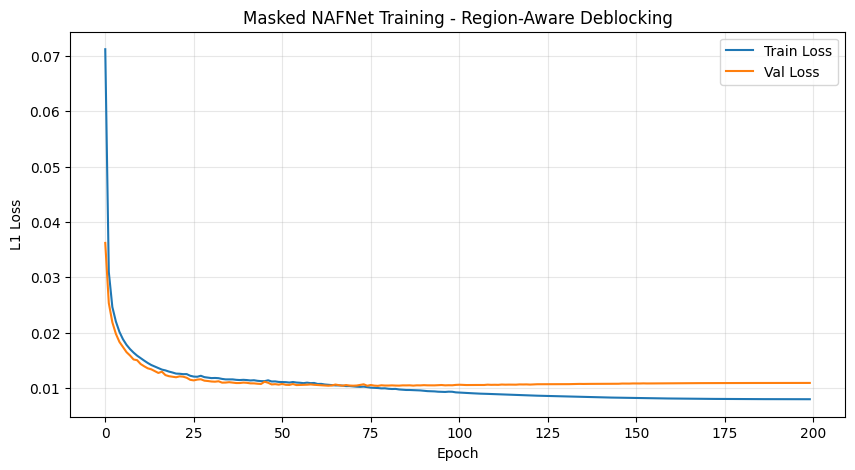


✅ Model saved to: /kaggle/working/block_nafnet_checkpoints/masked_nafnet_best.pth

🎨 GENERATING DEMO VISUALIZATIONS (8 Examples)

✅ Models loaded for demo!

🎨 Testing on SYNTHETIC partially-blocked images:
  - img146_var00.png
  - img146_var01.png
  - img174_var00.png
  - img174_var01.png
  - img147_var00.png
  - img147_var01.png
  - img148_var00.png
  - img148_var01.png

🎨 Running demo on 8 images...

Processing: img146_var00.png
  ✅ Detected 1 blocking regions (IoU=0.954)
  ✅ Saved: demo_1.png

Processing: img146_var01.png
  ✅ Detected 1 blocking regions (IoU=0.957)
  ✅ Saved: demo_2.png

Processing: img174_var00.png
  ✅ Detected 1 blocking regions (IoU=0.950)
  ✅ Saved: demo_3.png

Processing: img174_var01.png
  ✅ Detected 2 blocking regions (IoU=0.939)
  ✅ Saved: demo_4.png

Processing: img147_var00.png
  ✅ Detected 1 blocking regions (IoU=0.931)
  ✅ Saved: demo_5.png

Processing: img147_var01.png
  ✅ Detected 1 blocking regions (IoU=0.938)
  ✅ Saved: demo_6.png

Processing: img14

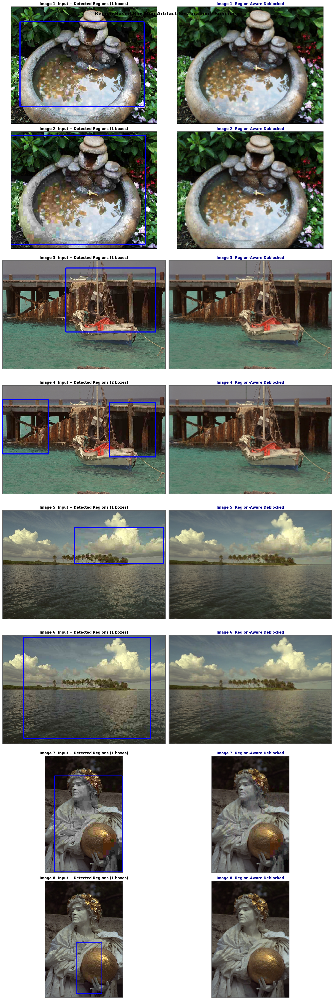


✅ Demo complete!

📁 Results saved to: /kaggle/working/block_demo_results/

📊 Files created:
  - demo_1.png (8-panel visualization)
  - demo_2.png (8-panel visualization)
  - demo_3.png (8-panel visualization)
  - demo_4.png (8-panel visualization)
  - demo_5.png (8-panel visualization)
  - demo_6.png (8-panel visualization)
  - demo_7.png (8-panel visualization)
  - demo_8.png (8-panel visualization)
  - summary_comparison.png (8 images before/after comparison)

🎉 Each demo shows:
  1. Input partially blocked image
  2. Ground truth mask
  3. U-Net predicted blocking probability
  4. Binary mask
  5. BLUE bounding boxes around detected blocking regions
  6. BLUE mask overlay (blue = blocking)
  7. Final deblocked result
  8. Prediction error with IoU score

💡 Note: Using BLUE color for blocking (different from red=blur, green=noise)

📊 Test Images:
  - 2x img146 (coinsinfountain)
  - 2x img174 (bikes)
  - 2x img147 (ocean)
  - 2x img148 (statue)


In [5]:
"""
Step 4: Train Masked NAFNet + Generate Demo with 8 Visual Examples
Combined script for deblocking training and comprehensive visualization with BLUE theme
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR

import cv2
import numpy as np
import glob
import os
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm
import time

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

# ============================================================================
# NAFNet Architecture (Modified to Accept Masks)
# ============================================================================

class LayerNorm2d(nn.Module):
    def __init__(self, channels, eps=1e-6):
        super().__init__()
        self.weight = nn.Parameter(torch.ones(channels))
        self.bias = nn.Parameter(torch.zeros(channels))
        self.eps = eps
    
    def forward(self, x):
        u = x.mean(1, keepdim=True)
        s = (x - u).pow(2).mean(1, keepdim=True)
        x = (x - u) / torch.sqrt(s + self.eps)
        x = self.weight[:, None, None] * x + self.bias[:, None, None]
        return x

class SimpleGate(nn.Module):
    def forward(self, x):
        x1, x2 = x.chunk(2, dim=1)
        return x1 * x2

class NAFBlock(nn.Module):
    def __init__(self, c, DW_Expand=2, FFN_Expand=2, drop_out_rate=0.):
        super().__init__()
        dw_channel = c * DW_Expand
        self.conv1 = nn.Conv2d(in_channels=c, out_channels=dw_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv2 = nn.Conv2d(in_channels=dw_channel, out_channels=dw_channel, kernel_size=3, padding=1, stride=1, groups=dw_channel, bias=True)
        self.conv3 = nn.Conv2d(in_channels=dw_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        
        self.sca = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels=dw_channel // 2, out_channels=dw_channel // 2, kernel_size=1, padding=0, stride=1, groups=1, bias=True),
        )
        
        self.sg = SimpleGate()
        
        ffn_channel = FFN_Expand * c
        self.conv4 = nn.Conv2d(in_channels=c, out_channels=ffn_channel, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        self.conv5 = nn.Conv2d(in_channels=ffn_channel // 2, out_channels=c, kernel_size=1, padding=0, stride=1, groups=1, bias=True)
        
        self.norm1 = LayerNorm2d(c)
        self.norm2 = LayerNorm2d(c)
        
        self.dropout1 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()
        self.dropout2 = nn.Dropout(drop_out_rate) if drop_out_rate > 0. else nn.Identity()
        
        self.beta = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)
        self.gamma = nn.Parameter(torch.zeros((1, c, 1, 1)), requires_grad=True)
    
    def forward(self, inp):
        x = inp
        
        x = self.norm1(x)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.sg(x)
        x = x * self.sca(x)
        x = self.conv3(x)
        x = self.dropout1(x)
        
        y = inp + x * self.beta
        
        x = self.conv4(self.norm2(y))
        x = self.sg(x)
        x = self.conv5(x)
        x = self.dropout2(x)
        
        return y + x * self.gamma

class MaskedNAFNet(nn.Module):
    """NAFNet that accepts image + mask (4 channels input)"""
    def __init__(self, img_channel=4, width=32, middle_blk_num=12, enc_blk_nums=[2,2,4,8], dec_blk_nums=[2,2,2,2]):
        super().__init__()
        
        self.intro = nn.Conv2d(in_channels=img_channel, out_channels=width, kernel_size=3, padding=1, stride=1, groups=1, bias=True)
        self.ending = nn.Conv2d(in_channels=width, out_channels=3, kernel_size=3, padding=1, stride=1, groups=1, bias=True)
        
        self.encoders = nn.ModuleList()
        self.decoders = nn.ModuleList()
        self.middle_blks = nn.ModuleList()
        self.ups = nn.ModuleList()
        self.downs = nn.ModuleList()
        
        chan = width
        for num in enc_blk_nums:
            self.encoders.append(nn.Sequential(*[NAFBlock(chan) for _ in range(num)]))
            self.downs.append(nn.Conv2d(chan, 2*chan, 2, 2))
            chan = chan * 2
        
        self.middle_blks = nn.Sequential(*[NAFBlock(chan) for _ in range(middle_blk_num)])
        
        for num in dec_blk_nums:
            self.ups.append(nn.Sequential(nn.Conv2d(chan, chan * 2, 1, bias=False), nn.PixelShuffle(2)))
            chan = chan // 2
            self.decoders.append(nn.Sequential(*[NAFBlock(chan) for _ in range(num)]))
        
        self.padder_size = 2 ** len(self.encoders)
    
    def forward(self, inp):
        B, C, H, W = inp.shape
        inp = self.check_image_size(inp)
        
        x = self.intro(inp)
        
        encs = []
        
        for encoder, down in zip(self.encoders, self.downs):
            x = encoder(x)
            encs.append(x)
            x = down(x)
        
        x = self.middle_blks(x)
        
        for decoder, up, enc_skip in zip(self.decoders, self.ups, encs[::-1]):
            x = up(x)
            x = x + enc_skip
            x = decoder(x)
        
        x = self.ending(x)
        x = x + inp[:, :3, :, :]  # Add only RGB channels
        
        return x[:, :, :H, :W]
    
    def check_image_size(self, x):
        _, _, h, w = x.size()
        mod_pad_h = (self.padder_size - h % self.padder_size) % self.padder_size
        mod_pad_w = (self.padder_size - w % self.padder_size) % self.padder_size
        x = F.pad(x, (0, mod_pad_w, 0, mod_pad_h), 'reflect')
        return x

# ============================================================================
# U-Net for Demo (abbreviated)
# ============================================================================

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        
        self.enc1 = DoubleConv(in_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = DoubleConv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = DoubleConv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = DoubleConv(256, 512)
        self.pool4 = nn.MaxPool2d(2)
        
        self.bottleneck = DoubleConv(512, 1024)
        
        self.up4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec4 = DoubleConv(1024, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = DoubleConv(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = DoubleConv(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = DoubleConv(128, 64)
        
        self.out = nn.Conv2d(64, out_channels, kernel_size=1)
    
    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        enc3 = self.enc3(self.pool2(enc2))
        enc4 = self.enc4(self.pool3(enc3))
        
        bottleneck = self.bottleneck(self.pool4(enc4))
        
        dec4 = self.up4(bottleneck)
        dec4 = torch.cat([dec4, enc4], dim=1)
        dec4 = self.dec4(dec4)
        
        dec3 = self.up3(dec4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)
        
        dec2 = self.up2(dec3)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)
        
        dec1 = self.up1(dec2)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)
        
        out = self.out(dec1)
        return torch.sigmoid(out)

# ============================================================================
# Dataset for Masked Deblocking
# ============================================================================

class MaskedDeblockingDataset(Dataset):
    def __init__(self, blocked_dir, mask_dir, sharp_dir, size=256):
        self.blocked_paths = sorted(glob.glob(f'{blocked_dir}/*.png'))
        self.mask_paths = sorted(glob.glob(f'{mask_dir}/*.png'))
        self.sharp_dir = sharp_dir
        self.size = size
    
    def __len__(self):
        return len(self.blocked_paths)
    
    def __getitem__(self, idx):
        # Load blocked and mask
        blocked = cv2.imread(self.blocked_paths[idx])
        mask = cv2.imread(self.mask_paths[idx], cv2.IMREAD_GRAYSCALE)
        
        # Get corresponding sharp image
        blocked_name = Path(self.blocked_paths[idx]).stem
        sharp_name = blocked_name.split('_var')[0]  # img146_var00 -> img146
        sharp_path = f'{self.sharp_dir}/{sharp_name}.bmp'
        
        sharp = cv2.imread(sharp_path)
        
        # Resize
        blocked = cv2.resize(blocked, (self.size, self.size))
        mask = cv2.resize(mask, (self.size, self.size))
        sharp = cv2.resize(sharp, (self.size, self.size))
        
        # Convert to RGB
        blocked = cv2.cvtColor(blocked, cv2.COLOR_BGR2RGB)
        sharp = cv2.cvtColor(sharp, cv2.COLOR_BGR2RGB)
        
        # Normalize
        blocked = blocked.astype(np.float32) / 255.0
        mask = mask.astype(np.float32) / 255.0
        sharp = sharp.astype(np.float32) / 255.0
        
        # To tensor
        blocked = torch.from_numpy(blocked).permute(2, 0, 1)
        mask = torch.from_numpy(mask).unsqueeze(0)
        sharp = torch.from_numpy(sharp).permute(2, 0, 1)
        
        # Concatenate blocked + mask (4 channels)
        input_tensor = torch.cat([blocked, mask], dim=0)
        
        return input_tensor, sharp

# ============================================================================
# Training Setup
# ============================================================================

# Use clean images from IQA Wn dataset (same 29 images used for all artifact types)
# Actual Kaggle path structure
SHARP_DIR = '/kaggle/input/datasets/wmpibweerasinghe/iqa-wn/Original_New'

# Fallback paths
if not os.path.exists(SHARP_DIR):
    print(f"⚠️ Primary path not found: {SHARP_DIR}")
    print("Trying alternative paths...")
    for alt_path in ['/kaggle/input/iqa-wn/Original_New',
                     '/kaggle/input/datasets/wmpibweerasinghe/iqa-gblur/sharp',
                     '/kaggle/input/iqa-gblur/sharp']:
        if os.path.exists(alt_path):
            SHARP_DIR = alt_path
            print(f"✅ Using: {SHARP_DIR}")
            break

print(f"📁 Using clean images from: {SHARP_DIR}")

BLOCKED_DIR = '/kaggle/working/block_mask_dataset/images'
MASK_DIR = '/kaggle/working/block_mask_dataset/masks'

# Create dataset
dataset = MaskedDeblockingDataset(BLOCKED_DIR, MASK_DIR, SHARP_DIR, size=256)
print(f"Dataset size: {len(dataset)}")

# Split
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# Dataloaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=2)

print(f"Train: {len(train_dataset)}, Val: {len(val_dataset)}")

# Model
model = MaskedNAFNet(
    img_channel=4,  # RGB + mask
    width=32,
    middle_blk_num=12,
    enc_blk_nums=[2, 2, 4, 8],
    dec_blk_nums=[2, 2, 2, 2]
).to(device)

total_params = sum(p.numel() for p in model.parameters())
print(f"Masked NAFNet parameters: {total_params:,}")

# Training config
NUM_EPOCHS = 200
LEARNING_RATE = 1e-4

criterion = nn.L1Loss()
optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=1e-4)
scheduler = CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS, eta_min=1e-6)

# ============================================================================
# Training Loop
# ============================================================================

checkpoint_dir = '/kaggle/working/block_nafnet_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)

train_losses = []
val_losses = []
best_val_loss = float('inf')

print("\n🚀 Starting Masked NAFNet training for deblocking...\n")
start_time = time.time()

for epoch in range(NUM_EPOCHS):
    # Train
    model.train()
    train_loss = 0.0
    
    for inputs, targets in train_loader:
        inputs = inputs.to(device)
        targets = targets.to(device)
        
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    train_loss /= len(train_loader)
    train_losses.append(train_loss)
    
    # Validation
    model.eval()
    val_loss = 0.0
    
    with torch.no_grad():
        for inputs, targets in val_loader:
            inputs = inputs.to(device)
            targets = targets.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_loss += loss.item()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    
    scheduler.step()
    
    # Print progress
    if (epoch + 1) % 20 == 0:
        elapsed = (time.time() - start_time) / 60
        print(f"Epoch {epoch+1}/{NUM_EPOCHS} | Train: {train_loss:.4f} | Val: {val_loss:.4f} | Time: {elapsed:.1f}min")
    
    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_loss': val_loss,
        }, f'{checkpoint_dir}/masked_nafnet_best.pth')

total_time = (time.time() - start_time) / 60
print(f"\n✅ Training complete! Time: {total_time:.1f} minutes")
print(f"Best validation loss: {best_val_loss:.4f}")

# Plot
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('L1 Loss')
plt.title('Masked NAFNet Training - Region-Aware Deblocking')
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig(f'{checkpoint_dir}/training_history.png', dpi=150)
plt.show()

print(f"\n✅ Model saved to: {checkpoint_dir}/masked_nafnet_best.pth")

# ============================================================================
# DEMO: Generate 8 Visual Examples with BLUE Theme
# ============================================================================

print("\n" + "="*80)
print("🎨 GENERATING DEMO VISUALIZATIONS (8 Examples)")
print("="*80 + "\n")

# Load U-Net for demo
unet = UNet(in_channels=3, out_channels=1).to(device)
unet_checkpoint = torch.load('/kaggle/working/block_unet_checkpoints/unet_best.pth')
unet.load_state_dict(unet_checkpoint['model_state_dict'])
unet.eval()

# NAFNet already loaded
nafnet = model
nafnet.eval()

print("✅ Models loaded for demo!")

# ============================================================================
# Complete Pipeline Function
# ============================================================================

def complete_demo(image_path, unet, nafnet, device):
    """Run complete pipeline and return all visualizations"""
    
    # Load image
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    # Resize for processing
    img_resized = cv2.resize(img_rgb, (256, 256))
    img_tensor = torch.from_numpy(img_resized).permute(2, 0, 1).float() / 255.0
    img_tensor = img_tensor.unsqueeze(0).to(device)
    
    # Step 1: Detect block mask
    with torch.no_grad():
        mask_pred = unet(img_tensor)
    
    # Step 2: Prepare input for deblocking
    input_with_mask = torch.cat([img_tensor, mask_pred], dim=1)
    
    # Step 3: Deblock image
    with torch.no_grad():
        deblocked = nafnet(input_with_mask)
    
    # Step 4: Blend
    mask_np = mask_pred.squeeze().cpu().numpy()
    mask_np = np.expand_dims(mask_np, axis=-1)
    
    img_np = img_tensor.squeeze().cpu().permute(1, 2, 0).numpy()
    deblocked_np = deblocked.squeeze().cpu().permute(1, 2, 0).numpy()
    
    final = mask_np * deblocked_np + (1 - mask_np) * img_np
    
    # Resize back
    final = cv2.resize(final, (w, h))
    mask_np = cv2.resize(mask_np.squeeze(), (w, h))
    img_rgb_original = cv2.resize(img_rgb, (w, h))
    
    # Convert to uint8
    final = np.clip(final * 255, 0, 255).astype(np.uint8)
    
    # Extract bounding boxes
    mask_binary = (mask_np > 0.5).astype(np.uint8) * 255
    contours, _ = cv2.findContours(mask_binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    boxes = []
    for contour in contours:
        if cv2.contourArea(contour) > 500:
            x, y, bw, bh = cv2.boundingRect(contour)
            boxes.append((x, y, bw, bh))
    
    return img_rgb_original, mask_np, mask_binary, boxes, final

# ============================================================================
# Create 8 Comprehensive Visualizations with BLUE color
# ============================================================================

# Test on synthetic partially-blocked images
SYNTHETIC_DIR = '/kaggle/working/block_mask_dataset/images'
MASK_GT_DIR = '/kaggle/working/block_mask_dataset/masks'

# Get synthetic test images
all_synthetic = sorted(glob.glob(f'{SYNTHETIC_DIR}/*.png'))

# Get diverse test images: 8 total
test_images = []

# Add img146 (coinsinfountain) - 2 variations
test_images.extend([img for img in all_synthetic if 'img146' in img][:2])

# Add bikes (img174) - 2 variations
test_images.extend([img for img in all_synthetic if 'img174' in img][:2])

# Add img147 (ocean) - 2 variations
test_images.extend([img for img in all_synthetic if 'img147' in img][:2])

# Add img148 (statue) - 2 variations
test_images.extend([img for img in all_synthetic if 'img148' in img][:2])

# Take first 8
test_images = test_images[:8]

print(f"\n🎨 Testing on SYNTHETIC partially-blocked images:")
for img in test_images:
    print(f"  - {Path(img).name}")

output_dir = '/kaggle/working/block_demo_results'
os.makedirs(output_dir, exist_ok=True)

print(f"\n🎨 Running demo on {len(test_images)} images...\n")

for idx, img_path in enumerate(test_images):
    print(f"Processing: {Path(img_path).name}")
    
    # Run pipeline
    original, mask, mask_binary, boxes, final = complete_demo(img_path, unet, nafnet, device)
    
    # Load ground truth mask for comparison
    mask_name = Path(img_path).stem + '.png'
    gt_mask_path = f'{MASK_GT_DIR}/{mask_name}'
    gt_mask = cv2.imread(gt_mask_path, cv2.IMREAD_GRAYSCALE)
    gt_mask = cv2.resize(gt_mask, (original.shape[1], original.shape[0]))
    
    # Create comprehensive visualization with ground truth and BLUE color
    fig = plt.figure(figsize=(24, 12))
    
    # Row 1: Original, Ground Truth, and Predicted Mask
    ax1 = plt.subplot(2, 4, 1)
    ax1.imshow(original)
    ax1.set_title('1. Input (Partially Blocked)', fontsize=14, fontweight='bold')
    ax1.axis('off')
    
    ax2 = plt.subplot(2, 4, 2)
    ax2.imshow(gt_mask, cmap='gray')
    ax2.set_title('2. Ground Truth Mask', fontsize=14, fontweight='bold', color='blue')
    ax2.axis('off')
    
    ax3 = plt.subplot(2, 4, 3)
    ax3.imshow(mask, cmap='hot')
    ax3.set_title('3. U-Net Prediction (Probability)', fontsize=14, fontweight='bold')
    ax3.axis('off')
    
    ax4 = plt.subplot(2, 4, 4)
    ax4.imshow(mask_binary, cmap='gray')
    ax4.set_title('4. Binary Mask (Threshold=0.5)', fontsize=14, fontweight='bold')
    ax4.axis('off')
    
    # Row 2: Bounding Boxes, Overlay, and Results
    ax5 = plt.subplot(2, 4, 5)
    img_boxes = original.copy()
    for box in boxes:
        x, y, w, h = box
        cv2.rectangle(img_boxes, (x, y), (x+w, y+h), (0, 0, 255), 4)  # BLUE boxes
    ax5.imshow(img_boxes)
    ax5.set_title(f'5. Detected Regions ({len(boxes)} boxes)', fontsize=14, fontweight='bold', color='blue')
    ax5.axis('off')
    
    ax6 = plt.subplot(2, 4, 6)
    # Show mask overlay on original with BLUE
    overlay = original.copy()
    mask_colored = np.zeros_like(original)
    mask_colored[:, :, 2] = mask * 255  # BLUE channel
    overlay = cv2.addWeighted(overlay, 0.7, mask_colored.astype(np.uint8), 0.3, 0)
    ax6.imshow(overlay)
    ax6.set_title('6. Mask Overlay (Blue = Blocking)', fontsize=14, fontweight='bold', color='blue')
    ax6.axis('off')
    
    ax7 = plt.subplot(2, 4, 7)
    ax7.imshow(final)
    ax7.set_title('7. Region-Aware Deblocked', fontsize=14, fontweight='bold', color='darkblue')
    ax7.axis('off')
    
    ax8 = plt.subplot(2, 4, 8)
    # Calculate IoU between prediction and ground truth
    gt_binary = (gt_mask > 127).astype(np.uint8)
    pred_binary = mask_binary // 255
    intersection = np.logical_and(gt_binary, pred_binary).sum()
    union = np.logical_or(gt_binary, pred_binary).sum()
    iou = intersection / union if union > 0 else 0
    
    # Show difference
    diff = np.abs(gt_binary.astype(float) - pred_binary.astype(float))
    ax8.imshow(diff, cmap='RdYlGn_r')
    ax8.set_title(f'8. Prediction Error (IoU={iou:.3f})', fontsize=14, fontweight='bold')
    ax8.axis('off')
    
    plt.suptitle(f'Region-Based Blocking Artifact Restoration - Image {idx+1} (Synthetic Data)', fontsize=16, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.savefig(f'{output_dir}/demo_{idx+1}.png', dpi=150, bbox_inches='tight')
    plt.close()
    
    print(f"  ✅ Detected {len(boxes)} blocking regions (IoU={iou:.3f})")
    print(f"  ✅ Saved: demo_{idx+1}.png\n")

# Create summary comparison with 8 images
fig, axes = plt.subplots(8, 2, figsize=(16, 48))

for idx, img_path in enumerate(test_images):
    original, mask, mask_binary, boxes, final = complete_demo(img_path, unet, nafnet, device)
    
    # Original with BLUE boxes
    img_boxes = original.copy()
    for box in boxes:
        x, y, w, h = box
        cv2.rectangle(img_boxes, (x, y), (x+w, y+h), (0, 0, 255), 4)  # BLUE
    
    axes[idx, 0].imshow(img_boxes)
    axes[idx, 0].set_title(f'Image {idx+1}: Input + Detected Regions ({len(boxes)} boxes)', fontsize=12, fontweight='bold')
    axes[idx, 0].axis('off')
    
    axes[idx, 1].imshow(final)
    axes[idx, 1].set_title(f'Image {idx+1}: Region-Aware Deblocked', fontsize=12, fontweight='bold', color='darkblue')
    axes[idx, 1].axis('off')

plt.suptitle('Region-Based Blocking Artifact Restoration - Summary', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(f'{output_dir}/summary_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\n✅ Demo complete!")
print(f"\n📁 Results saved to: {output_dir}/")
print(f"\n📊 Files created:")
for i in range(1, 9):
    print(f"  - demo_{i}.png (8-panel visualization)")
print(f"  - summary_comparison.png (8 images before/after comparison)")
print(f"\n🎉 Each demo shows:")
print(f"  1. Input partially blocked image")
print(f"  2. Ground truth mask")
print(f"  3. U-Net predicted blocking probability")
print(f"  4. Binary mask")
print(f"  5. BLUE bounding boxes around detected blocking regions")
print(f"  6. BLUE mask overlay (blue = blocking)")
print(f"  7. Final deblocked result")
print(f"  8. Prediction error with IoU score")
print(f"\n💡 Note: Using BLUE color for blocking (different from red=blur, green=noise)")
print(f"\n📊 Test Images:")
print(f"  - 2x img146 (coinsinfountain)")
print(f"  - 2x img174 (bikes)")
print(f"  - 2x img147 (ocean)")
print(f"  - 2x img148 (statue)")
